In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
%matplotlib inline

from minisom import MiniSom
from sklearn.preprocessing import minmax_scale, scale
from sklearn import preprocessing
import settings

In [8]:
data_folder = settings.data_folder
data_file = data_folder + 'Food_Supply_kcal_Data.csv'

In [1]:
data_file = './data_imputed_mice_rf_fao_averaged.csv'

In [5]:
df = pd.read_csv(data_file)

In [6]:
df.head()

,Country,Animal Products - Fat Supply,Animal fats - Fat Supply,"Aquatic Products, Other - Fat Supply",Cereals - Excluding Beer - Fat Supply,Eggs - Fat Supply,"Fish, Seafood - Fat Supply",Fruits - Excluding Wine - Fat Supply,Meat - Fat Supply,Miscellaneous - Fat Supply,...,"Wheat and products,Food supply (kcal/capita/day)","Wheat and products,Food supply quantity (kg/capita/yr)","Wheat and products,Losses","Wheat and products,Protein supply quantity (g/capita/day)","Wine,Domestic supply quantity","Wine,Food","Wine,Food supply (kcal/capita/day)","Wine,Food supply quantity (kg/capita/yr)",WHO code,FAO code
0,Afghanistan,0.521318,0.415206,0.0,0.405194,0.195145,0.001824,0.040196,0.237501,0.035738,...,0.814153,0.773783,0.127721,0.736385,0.000268,0.000000,0.000000,0.000000,0.476531,0.002857
1,Albania,0.846266,0.226969,0.0,0.096782,0.493163,0.015150,0.062737,0.356672,0.037273,...,0.634185,0.674224,0.005228,0.681993,0.007403,0.009810,0.172450,0.178555,0.713605,0.005714
2,Algeria,0.294800,0.057869,0.0,0.184792,0.360237,0.021861,0.056033,0.136084,0.096251,...,0.871581,0.924495,0.142571,0.884243,0.014506,0.000000,0.000000,0.000187,0.000000,0.008571
3,Angola,0.322608,0.085771,0.0,0.320020,0.029805,0.166651,0.032329,0.460624,0.067529,...,0.124954,0.143982,0.000000,0.128615,0.012624,0.017182,0.028985,0.031267,0.002383,0.017143
4,Antigua and Barbuda,0.711497,0.310941,0.0,0.127951,0.102312,0.179858,0.122507,0.610517,0.196887,...,0.318715,0.310406,0.005485,0.288941,0.000529,0.000359,0.124347,0.109342,0.238265,0.020000


In [18]:
for feature in df.columns:
    df = df[df[feature].notna()]
    df[feature] = df[feature].replace(r'[^\w\s]+', '')

In [7]:
df['binned'] = pd.cut(df['Deaths'], 5, labels = ['small', 'small-medium', 'medium', 'medium-large', 'large'])

In [8]:
all_countries = df['Country']

In [9]:
df['binned'].value_counts()

small           106
small-medium     21
medium           15
medium-large     15
large             5
Name: binned, dtype: int64

In [10]:
df_without_countries = df.iloc[:, 1:]

In [11]:
df_without_countries

,Animal Products - Fat Supply,Animal fats - Fat Supply,"Aquatic Products, Other - Fat Supply",Cereals - Excluding Beer - Fat Supply,Eggs - Fat Supply,"Fish, Seafood - Fat Supply",Fruits - Excluding Wine - Fat Supply,Meat - Fat Supply,Miscellaneous - Fat Supply,Milk - Excluding Butter - Fat Supply,...,"Wheat and products,Food supply quantity (kg/capita/yr)","Wheat and products,Losses","Wheat and products,Protein supply quantity (g/capita/day)","Wine,Domestic supply quantity","Wine,Food","Wine,Food supply (kcal/capita/day)","Wine,Food supply quantity (kg/capita/yr)",WHO code,FAO code,binned
0,0.521318,0.415206,0.0,0.405194,0.195145,0.001824,0.040196,0.237501,0.035738,0.460895,...,0.773783,0.127721,0.736385,0.000268,0.000000,0.000000,0.000000,0.476531,0.002857,small
1,0.846266,0.226969,0.0,0.096782,0.493163,0.015150,0.062737,0.356672,0.037273,1.000000,...,0.674224,0.005228,0.681993,0.007403,0.009810,0.172450,0.178555,0.713605,0.005714,small-medium
2,0.294800,0.057869,0.0,0.184792,0.360237,0.021861,0.056033,0.136084,0.096251,0.450264,...,0.924495,0.142571,0.884243,0.014506,0.000000,0.000000,0.000187,0.000000,0.008571,small
3,0.322608,0.085771,0.0,0.320020,0.029805,0.166651,0.032329,0.460624,0.067529,0.059899,...,0.143982,0.000000,0.128615,0.012624,0.017182,0.028985,0.031267,0.002383,0.017143,small
4,0.711497,0.310941,0.0,0.127951,0.102312,0.179858,0.122507,0.610517,0.196887,0.368766,...,0.310406,0.005485,0.288941,0.000529,0.000359,0.124347,0.109342,0.238265,0.020000,small
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157,0.310495,0.128723,0.0,0.180271,0.091031,0.168892,0.027804,0.410860,0.055690,0.055268,...,0.197853,0.005561,0.214912,0.000268,0.000000,0.019181,0.023092,1.000000,0.440000,small
158,0.354662,0.149807,0.0,0.089391,0.185697,0.065952,0.096177,0.281671,0.016882,0.303976,...,0.212926,0.004464,0.217694,0.000697,0.000595,0.000000,0.001252,0.450273,0.362129,small
159,0.235918,0.132750,0.0,0.606040,0.153344,0.043781,0.022739,0.322911,0.056128,0.066463,...,0.575408,0.001077,0.577035,0.000268,0.000000,0.000000,0.000000,0.574220,0.708571,small
160,0.143720,0.105788,0.0,0.766829,0.176716,0.117958,0.010067,0.181820,0.049112,0.062441,...,0.046583,0.000818,0.047469,0.000268,0.000000,0.000000,0.000187,0.131046,0.714286,small


In [24]:
# df_without_countries = df_without_countries.drop(['Undernourished'], axis=1)

In [12]:
features = df_without_countries.columns

In [26]:
x = df_without_countries.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
df_scaled = pd.DataFrame(x_scaled)

ValueError: could not convert string to float: '<2.5'

In [13]:
df_scaled.columns = features

NameError: name 'df_scaled' is not defined

In [15]:
len(all_countries)

162

In [14]:
df_scaled = df_without_countries

In [16]:
category_color = {'small': 'darkgreen',
                  'small-medium' : 'chartreuse',
                  'medium': 'yellow',
                  'medium-large': 'darkorange',
                  'large': 'crimson'
                  }

In [17]:
len(all_countries) == len(df['binned'])

True

In [22]:
colors_dict = {}
for c, dm in zip(all_countries, df['binned']):
    colors_dict[c] = category_color[dm]

In [23]:
feature_names

Index(['Animal Products - Fat Supply', 'Animal fats - Fat Supply',
       'Aquatic Products, Other - Fat Supply',
       'Cereals - Excluding Beer - Fat Supply', 'Eggs - Fat Supply',
       'Fish, Seafood - Fat Supply', 'Fruits - Excluding Wine - Fat Supply',
       'Meat - Fat Supply', 'Miscellaneous - Fat Supply',
       'Milk - Excluding Butter - Fat Supply',
       ...
       'Wheat and products,Food supply (kcal/capita/day)',
       'Wheat and products,Food supply quantity (kg/capita/yr)',
       'Wheat and products,Losses',
       'Wheat and products,Protein supply quantity (g/capita/day)',
       'Wine,Domestic supply quantity', 'Wine,Food',
       'Wine,Food supply (kcal/capita/day)',
       'Wine,Food supply quantity (kg/capita/yr)', 'WHO code', 'FAO code'],
      dtype='object', length=769)

In [25]:

country_codes = {'Afghanistan': 'AF',
 'Albania': 'AL',
 'Algeria': 'DZ',
 'Angola': 'AO',
 'Argentina': 'AR',
 'Armenia': 'AM',
 'Australia': 'AU',
 'Austria': 'AT',
 'Azerbaijan': 'AZ',
 'Bahrain': 'BH',
 'Bangladesh': 'BD',
 'Belarus': 'BY',
 'Belgium': 'BE',
 'Benin': 'BJ',
 'Bhutan': 'BT',
 'Bolivia': 'BO',
 'Bosnia and Herzegovina': 'BA',
 'Botswana': 'BW',
 'Brazil': 'BR',
 'Bulgaria': 'BG',
 'Burkina Faso': 'BF',
 'Burundi': 'BI',
 'Cambodia': 'KH',
 'Cameroon': 'CM',
 'Canada': 'CA',
 'Cape Verde': 'CV',
 'Central African Republic': 'CF',
 'Chad': 'TD',
 'Chile': 'CL',
 'China': 'CN',
 'Colombia': 'CO',
 'Comoros': 'KM',
 'Costa Rica': 'CR',
 'Croatia': 'HR',
 'Cuba': 'CU',
 'Cyprus': 'CY',
 'Czech Republic': 'CZ',
 'Democratic Republic of the Congo': 'CD',
 'Denmark': 'DK',
 'Djibouti': 'DJ',
 'Dominican Republic': 'DO',
 'Ecuador': 'EC',
 'Egypt': 'EG',
 'El Salvador': 'SV',
 'Equatorial Guinea': 'GQ',
 'Eritrea': 'ER',
 'Estonia': 'EE',
 'Ethiopia': 'ET',
 'Fiji': 'FJ',
 'Finland': 'FI',
 'France': 'FR',
 'Gabon': 'GA',
 'Gambia': 'GM',
 'Georgia': 'GE',
 'Germany': 'DE',
 'Ghana': 'GH',
 'Greece': 'GR',
 'Guatemala': 'GT',
 'Guinea': 'GN',
 'Guinea-Bissau': 'GW',
 'Guyana': 'GY',
 'Haiti': 'HT',
 'Honduras': 'HN',
 'Hong Kong': 'HK',
 'Hungary': 'HU',
 'Iceland': 'IS',
 'India': 'IN',
 'Indonesia': 'ID',
 'Iran': 'IR',
 'Iraq': 'IQ',
 'Ireland': 'IE',
 'Israel': 'IL',
 'Italy': 'IT',
 'Ivory Coast': 'IC',
 'Jamaica': 'JM',
 'Japan': 'JP',
 'Jordan': 'JO',
 'Kazakhstan': 'KZ',
 'Kenya': 'KE',
 'Kuwait': 'KW',
 'Kyrgyzstan': 'KG',
 'Laos': 'LA',
 'Latvia': 'LV',
 'Lebanon': 'LB',
 'Lesotho': 'LS',
 'Liberia': 'LR',
 'Libya': 'LY',
 'Lithuania': 'LT',
 'Luxembourg': 'LU',
 'Macedonia': 'MK',
 'Madagascar': 'MG',
 'Malawi': 'MW',
 'Malaysia': 'MY',
 'Mali': 'ML',
 'Malta': 'MT',
 'Mauritania': 'MR',
 'Mauritius': 'MU',
 'Mexico': 'MX',
 'Moldova': 'MD',
 'Mongolia': 'MN',
 'Montenegro': 'ME',
 'Morocco': 'MA',
 'Mozambique': 'MZ',
 'Myanmar': 'MM',
 'Namibia': 'NA',
 'Nepal': 'NP',
 'Netherlands': 'NL',
 'New Zealand': 'NZ',
 'North Macedonia': 'NM',
 'Nicaragua': 'NI',
 'Niger': 'NE',
 'Nigeria': 'NG',
 'North Korea': 'KP',
 'Norway': 'NO',
 'Oman': 'OM',
 'Pakistan': 'PK',
 'Palestine': 'PS',
 'Panama': 'PA',
 'Papua New Guinea': 'PG',
 'Paraguay': 'PY',
 'Peru': 'PE',
 'Philippines': 'PH',
 'Poland': 'PL',
 'Portugal': 'PT',
 'Qatar': 'QA',
 'Republic of China (Taiwan)': 'TW',
 'Republic of the Congo': 'CG',
 'Romania': 'RO',
 'Russia': 'RU',
 'Rwanda': 'RW',
 'Saudi Arabia': 'SA',
 'Senegal': 'SN',
 'Serbia': 'RS',
 'Sierra Leone': 'SL',
 'Singapore': 'SG',
 'Slovakia': 'SK',
 'Slovenia': 'SI',
 'South Africa': 'ZA',
 'South Korea': 'KR',
 'Spain': 'ES',
 'Sri Lanka': 'LK',
 'Sudan': 'SD',
 'Suriname': 'SR',
 'Swaziland': 'SZ',
 'Sweden': 'SE',
 'Switzerland': 'CH',
 'Syria': 'SY',
 'Tajikistan': 'TJ',
 'Tanzania': 'TZ',
 'Thailand': 'TH',
 'Timor-Leste': 'TL',
 'Togo': 'TG',
 'Trinidad and Tobago': 'TT',
 'Tunisia': 'TN',
 'Turkey': 'TR',
 'Turkmenistan': 'TM',
 'Uganda': 'UG',
 'Ukraine': 'UA',
 'United Arab Emirates': 'AE',
 'United Kingdom': 'GB',
 'United States': 'US',
 'Uruguay': 'UY',
 'Uzbekistan': 'UZ',
 'Venezuela': 'VE',
 'Vietnam': 'VN',
 'Yemen': 'YE',
 'Zambia': 'ZM',
 'Zimbabwe': 'ZW'}

In [20]:
feature_names = features[:-1]

X = df_scaled[feature_names].values

size = 15
som = MiniSom(size, size, len(X[0]),
              neighborhood_function='gaussian', sigma=1.5,
              random_seed=1)

som.pca_weights_init(X)
som.train_random(X, 1000, verbose=True)

C:\Users\Risto\.conda\envs\newEnv\lib\site-packages\minisom.py:370: ComplexWarning: Casting complex values to real discards the imaginary part
  self._weights[i, j] = c1*pc[pc_order[0]] + c2*pc[pc_order[1]]


 [ 1000 / 1000 ] 100% - 0:00:00 left 
 quantization error: 2.163877979324913


In [24]:
def shorten_country(c):
    if len(c) > 6 and c in country_codes:
        return country_codes[c]
    else:
        return c

country_map = som.labels_map(X, all_countries)
    
plt.figure(figsize=(14, 14))
for p, countries in country_map.items():
    countries = list(countries)
    x = p[0] + .1
    y = p[1] - .3
    for i, c in enumerate(countries):
        off_set = (i+1)/len(countries) - 0.05
        plt.text(x, y+off_set, shorten_country(c), color=colors_dict[c], fontsize=10)
plt.pcolor(som.distance_map().T, cmap='gray_r', alpha=.2)
plt.xticks(np.arange(size+1))
plt.yticks(np.arange(size+1))
plt.grid()

legend_elements = [Patch(facecolor=clr,
                         edgecolor='w',
                         label=l) for l, clr in category_color.items()]
plt.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1, .95))
plt.show()


NameError: name 'country_codes' is not defined

<Figure size 1008x1008 with 0 Axes>

ValueError: num must be 1 <= num <= 9, not 10

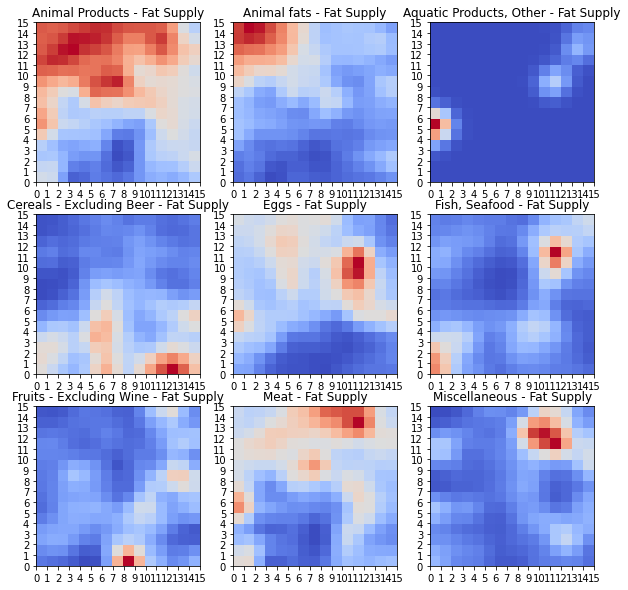

In [29]:
W = som.get_weights()
plt.figure(figsize=(10, 10))
for i, f in enumerate(feature_names):
    plt.subplot(3, 3, i+1)
    plt.title(f)
    plt.pcolor(W[:,:,i].T, cmap='coolwarm')
    plt.xticks(np.arange(size+1))
    plt.yticks(np.arange(size+1))
plt.tight_layout()
plt.show()

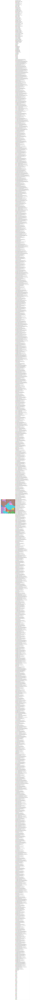

In [31]:
Z = np.zeros((size, size))
plt.figure(figsize=(8, 8))
for i in np.arange(som._weights.shape[0]):
    for j in np.arange(som._weights.shape[1]):
        feature = np.argmax(W[i, j , :])
        plt.plot([j+.5], [i+.5], 'o', color='C'+str(feature),
                 marker='s', markersize=24)

legend_elements = [Patch(facecolor='C'+str(i),
                         edgecolor='w',
                         label=f) for i, f in enumerate(feature_names)]

plt.legend(handles=legend_elements,
           loc='center left',
           bbox_to_anchor=(1, .95))
        
plt.xlim([0, size])
plt.ylim([0, size])
plt.show()